# HW3 : Unsupervised Outlier Detection & Analysis

組名 : 大可不必

組員 : 葉嘉浤、黃科銓、高涵毅

詳細資料請參考 [Github連結](https://github.com/Ololkao/BDA_HW3)

In [1]:
from __future__ import division
from __future__ import print_function

import os
import sys
import umap.umap_ as umap
import umap
from glob import glob
from time import time

# supress warnings for clean output
import warnings

warnings.filterwarnings("ignore")

import numpy as np
from numpy import percentile
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib.font_manager
from scipy.io import loadmat

from pyod.models.knn import KNN
from pyod.models.pca import PCA
from pyod.models.mcd import MCD
from pyod.models.hbos import HBOS
from pyod.models.abod import ABOD
from pyod.models.feature_bagging import FeatureBagging
from pyod.models.cblof import CBLOF
from pyod.models.iforest import IForest
from pyod.models.lof import LOF
from pyod.models.ocsvm import OCSVM
from pyod.models.deep_svdd import DeepSVDD
from pyod.models.auto_encoder import AutoEncoder
import tensorflow
from joblib import dump, load

from pyod.utils.utility import standardizer
from pyod.utils.utility import precision_n_scores
from pyod.utils.example import visualize
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from pyod.utils.data import evaluate_print
from pyod.models.combination import *

In [ ]:
#將資料名稱放進一個list
csv_file_list = ['mnist.csv', 'musk.csv', 'optdigits.csv', 'pendigits.csv', 'satimage-2.csv']

#設定模型的random seed
random_state = np.random.RandomState(69)
outliers_fraction = 0.1

#建立一個存分數的data frame
auc_df = pd.DataFrame()
prn_df = pd.DataFrame()
recall_df = pd.DataFrame()

#資料的路徑
path = r'C:\Users\Chiahung\Desktop\newfolder\巨量\HW3\HW3資料集'
#重複次數
trials = 5
#第一層迴圈:讀取資料
for csv_file in csv_file_list:
    print("\n... Processing", csv_file, '...')
    data = pd.read_csv(os.path.join(path,csv_file))
    #分成label、target
    label = data['outlier']
    feature = data.iloc[:,:-1]
    #所有的方法
    classifiers = {'KNN':KNN(n_neighbors=50,method='largest'),
                  'AvgKNN':KNN(n_neighbors=50,method='mean'),
                  'MedKNN':KNN(n_neighbors=50,method='median'),
                  'PCA':PCA(random_state=69),
                  'MCD':MCD(random_state=69),
                  'HBOS':HBOS(n_bins=15),
                  'ABOD':ABOD(n_neighbors=50,method='fast'),
                  'FeatureBagging':FeatureBagging(random_state=69),
                  'One-class SVM (OCSVM)':OCSVM(contamination=outliers_fraction),
                  'Local Outlier Factor (LOF)': LOF(contamination=outliers_fraction,n_neighbors=110),
                  'Isolation Forest': IForest(contamination=outliers_fraction,n_estimators=200,random_state=69),
                  'AutoEncoder': AutoEncoder(hidden_neurons=[2, 32,64,64, 32, 2],contamination=outliers_fraction,random_state=69,epochs=150),
                  'DeepSVDD':DeepSVDD(hidden_neurons=[X.shape[1],X.shape[1]*20], contamination=outliers_fraction,random_state=69,epochs=100,validation_size=0.05)}
    #建立存分數的list
    auc_list = list()
    prn_list = list()
    recall_list = list()
    #第二層迴圈:執行13個方法
    for clf_name, clf in classifiers.items():
        auc = 0
        prn = 0
        recall = 0
        #第三層迴圈:重複執行5次
        for trial in range(trials):
            x_train,x_test,y_train,y_test = train_test_split(feature,label,test_size=0.3,random_state=trial)
            x_train_norm, x_test_norm = standardizer(x_train, x_test)
            clf.fit(x_train_norm)
            test_scores = clf.decision_function(x_test_norm)
            y_pred = clf.predict(x_test_norm)
            
            #將5次的分數加總
            auc += round(roc_auc_score(y_test, test_scores), ndigits=3)
            prn += round(precision_n_scores(y_test, test_scores), ndigits=3)
            recall += round(recall_score(y_test,y_pred),ndigits=3)
        
        auc = round(auc/trials,ndigits=3)
        prn = round(prn/trials,ndigits=3)
        recall = round(recall/trials,ndigits=3)
        print('{clf_name} AUC:{auc}, precision @ rank n:{prn}, '.format(clf_name=clf_name, auc=auc, prn=prn))
        print('recall',recall)
        
        #將算好的分數放在list
        auc_list.append(auc)
        prn_list.append(prn)
        recall_list.append(recall)
    #將存好分數的list合併到data frame    
    temp_df = pd.DataFrame(auc_list)
    auc_df = pd.concat([auc_df, temp_df], axis=1)
    
    temp2_df = pd.DataFrame(prn_list)
    prn_df = pd.concat([prn_df,temp2_df], axis=1)
    
    temp3_df = pd.DataFrame(recall_list)
    recall_df = pd.concat([recall_df,temp3_df], axis=1)


... Processing mnist.csv ...
KNN AUC:0.873, precision @ rank n:0.408, 
recall 0.472
AvgKNN AUC:0.866, precision @ rank n:0.42, 
recall 0.465
MedKNN AUC:0.868, precision @ rank n:0.419, 
recall 0.469
PCA AUC:0.851, precision @ rank n:0.379, 
recall 0.421
MCD AUC:0.857, precision @ rank n:0.292, 
recall 0.335
HBOS AUC:0.546, precision @ rank n:0.096, 
recall 0.112
ABOD AUC:0.842, precision @ rank n:0.426, 
recall 0.465
FeatureBagging AUC:0.708, precision @ rank n:0.326, 
recall 0.344

... Processing musk.csv ...
KNN AUC:1.0, precision @ rank n:0.958, 
recall 1.0
AvgKNN AUC:0.985, precision @ rank n:0.694, 
recall 0.944
MedKNN AUC:0.983, precision @ rank n:0.704, 
recall 0.93
PCA AUC:1.0, precision @ rank n:1.0, 
recall 1.0
MCD AUC:1.0, precision @ rank n:0.988, 
recall 1.0
HBOS AUC:1.0, precision @ rank n:1.0, 
recall 1.0
ABOD AUC:0.196, precision @ rank n:0.126, 
recall 0.137
FeatureBagging AUC:0.634, precision @ rank n:0.255, 
recall 0.426

... Processing optdigits.csv ...
KNN AUC:0.4

In [ ]:
#將column名稱換成資料名稱、row名稱改成方法
df_columns = ['mnist', 'musk', 'optdigits', 'pendigits', 'satimage-2']
df_rows = ['KNN', 'AvgKNN', 'MedKNN', 'PCA', 'MCD', 'HBOS', 'ABOD', 'FeatureBagging']
auc_df.columns = df_columns
auc_df.index = df_rows
prn_df.columns = df_columns
prn_df.index = df_rows
recall_df.columns = df_columns
recall_df.index = df_rows

## Task 1

In [3]:
print('AUC')
auc_df
#auc_df.to_csv('AUC_with_parameter_70%.csv')

AUC


,mnist,musk,optdigits,pendigits,satimage-2
KNN,0.87300,1.00000,0.42500,0.93700,0.99900
AvgKNN,0.86600,0.98500,0.38400,0.88100,0.99700
MedKNN,0.86800,0.98300,0.37800,0.86900,0.99500
PCA,0.85100,1.00000,0.51600,0.93800,0.99000
MCD,0.85700,1.00000,0.37900,0.83800,0.99600
HBOS,0.54600,1.00000,0.87800,0.91200,0.98800
ABOD,0.84200,0.19600,0.45500,0.77200,0.95800
FeatureBagging,0.70800,0.63400,0.51200,0.51500,0.46500
One-class SVM (OCSVM),0.87772,1.00000,0.60342,0.96430,0.99636
Local Outlier Factor (LOF),0.93652,1.00000,0.91218,0.97948,0.99702


## Task 2

In [5]:
print('Recall')
recall_df
#recall_df.to_csv('Recall_with_parameter_70%.csv')

Recall


,mnist,musk,optdigits,pendigits,satimage-2
KNN,0.47200,1.00000,0.02300,0.72500,1.00000
AvgKNN,0.46500,0.94400,0.03100,0.47500,1.00000
MedKNN,0.46900,0.93000,0.03100,0.44400,1.00000
PCA,0.42100,1.00000,0.00500,0.65800,0.95000
MCD,0.33500,1.00000,0.00000,0.31600,1.00000
HBOS,0.11200,1.00000,0.53200,0.69100,0.96200
ABOD,0.46500,0.13700,0.06100,0.27200,0.86200
FeatureBagging,0.34400,0.42600,0.12000,0.17800,0.23500
One-class SVM (OCSVM),0.42210,1.00000,0.00000,0.39828,0.87794
Local Outlier Factor (LOF),0.64584,1.00000,0.39294,0.80136,0.82924


## My model

In [ ]:
# Define data file and read X and y
csv_file_list = ['mnist.csv',
                 'musk.csv',
                 'optdigits.csv',
                 'pendigits.csv',
                 'satimage-2.csv']

# Define thirteen outlier detection tools to be compared
df_columns = ['Data', '#Samples', '# Dimensions', 'Outlier Perc', 
              'KNN', 'AvgKNN', 'MedKNN', 'PCA', 'MCD', 'HBOS', 'ABOD', 
              'FB', 'OCSVM', 'LOF', 'IForest', 
              'AutoEncoder', 'DeepSVDD'
              ]

# define the number of iterations
n_ite = 5
n_classifiers = len(df_columns[4:])

# initialize the container for saving the results
auc_df = rec_df = time_df = pd.DataFrame(columns = df_columns[0:1] + df_columns[4:])

for idx, csv_file in enumerate(csv_file_list):
    csv = pd.read_csv(csv_file).values
    X, y = csv[:,:-1], csv[:, -1]
    outliers_fraction = np.count_nonzero(y) / len(y)
    outliers_percentage = round(outliers_fraction * 100, ndigits=4)
    
    # construct containers for saving results
    auc_list = rec_list = time_list = [csv_file[:-4]]
    auc_mat = np.zeros([n_ite, n_classifiers])
    rec_mat = np.zeros([n_ite, n_classifiers])
    time_mat = np.zeros([n_ite, n_classifiers])
    
    # split the real test dataset (6%)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.06, random_state=69)
    scores_mat = np.zeros([n_classifiers, len(y_test)])
    y_pred_mat = np.zeros([n_classifiers, len(y_test)])
    
    for ite in range(0, n_ite):
        print("\n... Processing", csv_file, '...', 'Iteration', ite + 1)
        random_state = np.random.RandomState(ite)
        # 70.5% data for training and 29.5% for testing (valid + test)
        X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.25,
                                                              random_state=random_state)
        
        # standardizing data for processing
        X_train_norm, X_valid_norm = standardizer(X_train, X_valid)
        X_train_norm, X_test_norm = standardizer(X_train, X_test)
        # umap for dimension reduction
        reducer = umap.UMAP(random_state=69, n_neighbors=20, n_components=2, n_epochs=1000, min_dist=0.3, spread=0.8)
        X_train_norm = reducer.fit_transform(X_train_norm)
        X_valid_norm = reducer.transform(X_valid_norm)
        X_test_norm = reducer.transform(X_test_norm)
        # one-class classification or not ??
        X_train_norm = X_train_norm[y_train == 0]

        classifiers = {
            'K Nearest Neighbors-1 (KNN)': KNN(contamination=outliers_fraction),
            'K Nearest Neighbors-2 (AvgKNN)': KNN(contamination=outliers_fraction, method='mean'),
            'K Nearest Neighbors-3 (MedKNN)': KNN(contamination=outliers_fraction, method='median'),
            'Principal Component Analysis (PCA)': PCA(
                contamination=outliers_fraction, random_state=69),
            'Minimum Covariance Determinant (MCD)': MCD(
                contamination=outliers_fraction, random_state=69),
            'Histogram-base Outlier Detection (HBOS)': HBOS(
                contamination=outliers_fraction),
            'Angle-based Outlier Detector (ABOD)': ABOD(
                contamination=outliers_fraction),
            'Feature Bagging (FB)': FeatureBagging(contamination=outliers_fraction,
                                            random_state=69),
            'One-class SVM (OCSVM)': OCSVM(contamination=outliers_fraction),
            'Local Outlier Factor (LOF)': LOF(
                contamination=outliers_fraction),
            'Isolation Forest (IForest)': IForest(contamination=outliers_fraction,
                                            random_state=69),
            'AutoEncoder (AE)': AutoEncoder(
                hidden_neurons=[2, 32, 64, 64, 32, 2], preprocessing=False, 
                verbose=0, random_state=69, contamination=outliers_fraction),
            'DeepSVDD (DeepSVDD)':DeepSVDD(
                use_ae=False, hidden_neurons=[X_train.shape[1]*5, X_train.shape[1]*20, X_train.shape[1]*5], epochs=200,
                preprocessing=False, verbose=0, random_state=69, contamination=outliers_fraction)
        }
        
        for col, (clf_name, clf) in enumerate(classifiers.items()):
            name = clf_name.split('(')[1][:-1]
            os.makedirs(name, exist_ok=True)

            t0 = time()
            clf.fit(X_train_norm)
            # save the model
            save_path = '{folder}/{data}_{ite}'.format(folder=name, data=csv_file[:-4], ite=ite)
            if 10 < col < 13:
                #serialize model to JSON
                model_json = clf.model_.to_json()
                with open(save_path + '.json', 'w') as handle:
                    handle.write(model_json)
                #serialize weights to HDF5
                clf.model_.save_weights(save_path + '.h5')
            else:
                with open(save_path + '.joblib', 'wb') as handle:
                    dump(clf, handle)
            
            valid_scores = clf.decision_function(X_valid_norm)
            scores_pred = clf.decision_function(X_test_norm) * -1
            y_pred = clf.predict(X_test_norm)
            t1 = time()
            duration = round(t1 - t0, ndigits=4)
            
            ''' should modify the code for verbose parameter and the return values '''
            auc, prn, rec = evaluate_print(clf_name, y_valid, valid_scores, verbose=0)
            print('{name} ROC:{auc}, recall @ rank n:{rec}, '
                'execution time: {duration}s'.format(
                name=name, auc=auc, rec=rec, duration=duration))
            
            time_mat[ite, col] = duration
            auc_mat[ite, col] = auc
            rec_mat[ite, col] = rec
            scores_mat[col, :] += scores_pred
            y_pred_mat[col, :] += y_pred

            if 10 < col < 13:
                #then set the model to None
                clf.model_ = None
                with open(save_path + '.joblib', 'wb') as handle:
                    dump(clf, handle)

    time_list = time_list + np.mean(time_mat, axis=0).tolist()
    temp_df = pd.DataFrame(time_list).transpose()
    temp_df.columns = df_columns if temp_df.shape[1] == len(df_columns) else df_columns[0:1] + df_columns[4:]
    time_df = pd.concat([time_df, temp_df], axis=0)

    auc_list = auc_list + np.mean(auc_mat, axis=0).tolist()
    temp_df = pd.DataFrame(auc_list).transpose()
    temp_df.columns = df_columns if temp_df.shape[1] == len(df_columns) else df_columns[0:1] + df_columns[4:]
    auc_df = pd.concat([auc_df, temp_df], axis=0)

    rec_list = rec_list + np.mean(rec_mat, axis=0).tolist()
    temp_df = pd.DataFrame(rec_list).transpose()
    temp_df.columns = df_columns if temp_df.shape[1] == len(df_columns) else df_columns[0:1] + df_columns[4:]
    rec_df = pd.concat([rec_df, temp_df], axis=0)

    scores_mat = scores_mat / n_ite
    y_pred_mat = np.where(y_pred_mat <= (n_ite // 2), 0, 1)
    np.save('npy/' + csv_file[:-4] + '_scores.npy', scores_mat.transpose())
    np.save('npy/' + csv_file[:-4] + '_pred.npy', y_pred_mat.transpose())


... Processing mnist.csv ... Iteration 1
KNN ROC:0.8423, recall @ rank n:0.6024, execution time: 1.8634s
AvgKNN ROC:0.8407, recall @ rank n:0.6205, execution time: 0.4519s
MedKNN ROC:0.8246, recall @ rank n:0.5964, execution time: 0.5236s
PCA ROC:0.689, recall @ rank n:0.0783, execution time: 0.01s
MCD ROC:0.9112, recall @ rank n:0.6386, execution time: 3.3769s
HBOS ROC:0.8925, recall @ rank n:0.5904, execution time: 1.6601s
ABOD ROC:0.8351, recall @ rank n:0.6084, execution time: 3.2165s
FB ROC:0.8423, recall @ rank n:0.6506, execution time: 0.5803s
OCSVM ROC:0.9069, recall @ rank n:0.6867, execution time: 3.2543s
LOF ROC:0.8489, recall @ rank n:0.6566, execution time: 0.0727s
IForest ROC:0.9041, recall @ rank n:0.6386, execution time: 1.1956s
AE ROC:0.3476, recall @ rank n:0.0904, execution time: 157.2587s
DeepSVDD ROC:0.4863, recall @ rank n:0.0, execution time: 181.3297s

... Processing mnist.csv ... Iteration 2
KNN ROC:0.8411, recall @ rank n:0.5833, execution time: 1.6609s
AvgKN

In [ ]:
print('AUC Performance')
auc_df.set_index('Data').transpose()

AUC Performance


Data,mnist,musk,optdigits,pendigits,satimage-2
KNN,0.81504,1.0,0.99842,0.99628,0.96608
AvgKNN,0.81262,1.0,0.99902,0.9975,0.97094
MedKNN,0.80188,1.0,0.9987,0.9969,0.96864
PCA,0.67194,0.87452,0.99862,0.30032,0.63004
MCD,0.87442,1.0,0.99902,0.75288,0.74504
HBOS,0.86748,0.83206,0.98516,0.869,0.87008
ABOD,0.80632,1.0,0.99926,0.9974,0.97846
FB,0.82318,1.0,0.99988,0.99236,0.89002
OCSVM,0.87292,1.0,0.99958,0.99474,0.96746
LOF,0.8414,1.0,0.99922,0.99378,0.9028


In [ ]:
print('Recall @ n Performance')
rec_df.set_index('Data').transpose()

Recall @ n Performance


Data,mnist,musk,optdigits,pendigits,satimage-2
KNN,0.56096,1.0,0.99428,0.9629,0.70252
AvgKNN,0.5682,1.0,0.99428,0.9629,0.70252
MedKNN,0.5521,1.0,0.99428,0.9629,0.7442
PCA,0.10634,0.6909,0.99428,0.0,0.0
MCD,0.57436,1.0,0.99428,0.0,0.0
HBOS,0.55328,0.6,0.53544,0.15224,0.0
ABOD,0.54878,1.0,0.99428,0.95114,0.7692
FB,0.58236,1.0,0.99428,0.7908,0.5692
OCSVM,0.58376,1.0,0.99428,0.93012,0.7692
LOF,0.59716,1.0,0.99428,0.88102,0.51088


In [ ]:
train_scores_norm, valid_scores_norm = standardizer(y_pred_mat.transpose(), scores_mat.transpose())
comb_by_average = average(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

comb_by_average = maximization(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

comb_by_average = median(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

Local Outlier Factor (LOF) ROC:0.9015, precision @ rank n:0.6867, recall @ rank n:0.6867
Local Outlier Factor (LOF) ROC:0.9008, precision @ rank n:0.6687, recall @ rank n:0.6687
Local Outlier Factor (LOF) ROC:0.8901, precision @ rank n:0.6747, recall @ rank n:0.6747


(0.8901, 0.6747, 0.6747)

In [ ]:
train_scores_norm, valid_scores_norm = standardizer(y_pred_mat.transpose(), scores_mat.transpose())
comb_by_average = average(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

comb_by_average = maximization(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

comb_by_average = median(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

Local Outlier Factor (LOF) ROC:1.0, precision @ rank n:1.0, recall @ rank n:1.0
Local Outlier Factor (LOF) ROC:1.0, precision @ rank n:1.0, recall @ rank n:1.0
Local Outlier Factor (LOF) ROC:1.0, precision @ rank n:1.0, recall @ rank n:1.0


(1.0, 1.0, 1.0)

In [ ]:
train_scores_norm, valid_scores_norm = standardizer(y_pred_mat.transpose(), scores_mat.transpose())
comb_by_average = average(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

comb_by_average = maximization(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

comb_by_average = median(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

Local Outlier Factor (LOF) ROC:0.9986, precision @ rank n:0.9714, recall @ rank n:0.9714
Local Outlier Factor (LOF) ROC:0.9988, precision @ rank n:0.9714, recall @ rank n:0.9714
Local Outlier Factor (LOF) ROC:0.9979, precision @ rank n:0.9714, recall @ rank n:0.9714


(0.9979, 0.9714, 0.9714)

In [ ]:
train_scores_norm, valid_scores_norm = standardizer(y_pred_mat.transpose(), scores_mat.transpose())
comb_by_average = average(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

comb_by_average = maximization(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

comb_by_average = median(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

Local Outlier Factor (LOF) ROC:0.9975, precision @ rank n:0.9706, recall @ rank n:0.9706
Local Outlier Factor (LOF) ROC:0.9976, precision @ rank n:0.9706, recall @ rank n:0.9706
Local Outlier Factor (LOF) ROC:0.9955, precision @ rank n:0.9706, recall @ rank n:0.9706


(0.9955, 0.9706, 0.9706)

In [ ]:
train_scores_norm, valid_scores_norm = standardizer(y_pred_mat.transpose(), scores_mat.transpose())
comb_by_average = average(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

comb_by_average = maximization(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

comb_by_average = median(valid_scores_norm)
evaluate_print(clf_name, y_valid, comb_by_average, verbose=1)

Local Outlier Factor (LOF) ROC:0.9482, precision @ rank n:0.7917, recall @ rank n:0.7917
Local Outlier Factor (LOF) ROC:0.9516, precision @ rank n:0.75, recall @ rank n:0.75
Local Outlier Factor (LOF) ROC:0.9305, precision @ rank n:0.7917, recall @ rank n:0.7917


(0.9305, 0.7917, 0.7917)

## Task 3

In [ ]:
def compare_models_visualization():
    random_state = 69
    
    for idx, csv_file in enumerate(csv_file_list):
        csv = pd.read_csv(csv_file).values
        X, y = csv[:,:-1], csv[:, -1]
        outliers_fraction = np.count_nonzero(y) / len(y)

        # split the real test dataset (6%)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.06, random_state=69)

        # Define thirteen outlier detection tools to be compared
        classifiers = {
            'K Nearest Neighbors-1 (KNN)': KNN(contamination=outliers_fraction),
            'K Nearest Neighbors-2 (AvgKNN)': KNN(contamination=outliers_fraction, method='mean'),
            'K Nearest Neighbors-3 (MedKNN)': KNN(contamination=outliers_fraction, method='median'),
            'Principal Component Analysis (PCA)': PCA(
                contamination=outliers_fraction, random_state=random_state),
            'Minimum Covariance Determinant (MCD)': MCD(
                contamination=outliers_fraction, random_state=random_state),
            'Histogram-base Outlier Detection (HBOS)': HBOS(
                contamination=outliers_fraction),
            'Angle-based Outlier Detector (ABOD)': ABOD(
                contamination=outliers_fraction),
            'Feature Bagging (FB)': FeatureBagging(contamination=outliers_fraction,
                                            random_state=random_state),
            'One-class SVM (OCSVM)': OCSVM(contamination=outliers_fraction),
            'Local Outlier Factor (LOF)': LOF(
                contamination=outliers_fraction),
            'Isolation Forest (IForest)': IForest(contamination=outliers_fraction,
                                            random_state=random_state),
            'AutoEncoder (AE)': AutoEncoder(
                hidden_neurons=[2, 64, 64, 2], preprocessing=False, 
                verbose=0, random_state=69, contamination=outliers_fraction),
            'DeepSVDD (DeepSVDD)':DeepSVDD(
                use_ae=False, hidden_neurons=[X_train.shape[1]*5, X_train.shape[1]*20, X_train.shape[1]*5], epochs=200,
                preprocessing=False, verbose=0, random_state=69, contamination=outliers_fraction)
        }

        # # Show all detectors
        # for i, clf in enumerate(classifiers.keys()):
        #     print('Model', i + 1, clf)

        plt.figure(num=idx, figsize=(15, 12))
        scores_pred = np.load('npy/' + csv_file[:-4] + '_scores.npy')
        y_pred = np.load('npy/' + csv_file[:-4] + '_pred.npy')

        for i, (clf_name, clf) in enumerate(classifiers.items()):
            name = clf_name.split('(')[1][:-1]
            # print()
            print(i + 1, 'loading', name)
            threshold = percentile(scores_pred[:, i], 100 * outliers_fraction)
            # print(threshold)
            n_errors = (y_pred[:, i] != y_test).sum()
            ite = np.random.choice(5)
            # ite = 0
            
            # load the model
            load_path = '{folder}/{data}_{ite}'.format(folder=name, data=csv_file[:-4], ite=ite)
            if 10 < i < 13:
                # load the instance
                with open(load_path + '.joblib', 'rb') as handle:
                    model = load(handle)
                # load json and create model
                with open(load_path + '.json') as handle:
                    loaded_model_json = handle.read()
                    loaded_model_json = loaded_model_json.replace("\"ragged\": false,", " ")
                # load weights into new model
                loaded_model_ = tensorflow.keras.models.model_from_json(loaded_model_json)
                loaded_model_.load_weights(load_path + '.h5')
                model.model_ = loaded_model_
            else:
                with open(load_path + '.joblib', 'rb') as handle:
                    model = load(handle)
            
            X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.25,
                                                                  random_state=ite)
            # standardizing data for processing
            X_train_norm, X_test_norm = standardizer(X_train, X_test)
            # umap for dimension reduction
            reducer = umap.UMAP(random_state=69, n_neighbors=20, n_components=2, n_epochs=800, min_dist=0.3, spread=0.8)
            X_train_norm = reducer.fit_transform(X_train_norm)
            X_test_norm = reducer.transform(X_test_norm)
            _xx, _yy = X_test_norm[:, 0], X_test_norm[:, 1]
            
            if name == 'DeepSVDD': continue
            xx, yy = np.meshgrid(np.linspace(_xx.min()-3, _xx.max()+3, 100), np.linspace(_yy.min()-3, _yy.max()+3, 100))
            # plot the levels lines and the points
            Z = model.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
            Z = Z.reshape(xx.shape)
            subplot = plt.subplot(4, 4, i + 1)
            subplot.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),
                            cmap=plt.cm.Blues_r)
            # print(Z.min(), Z.max())
            a = subplot.contour(xx, yy, Z, levels=[threshold],
                                linewidths=2, colors='red')
            subplot.contourf(xx, yy, Z, levels=[threshold, Z.max()],
                            colors='orange')
            
            inlier = X_test_norm[y_test == 0]
            outlier = X_test_norm[y_test == 1]
            b = subplot.scatter(pd.DataFrame(inlier).iloc[:, 0], pd.DataFrame(inlier).iloc[:, 1], c='white',
                                s=20, edgecolor='k')
            c = subplot.scatter(pd.DataFrame(outlier).iloc[:, 0], pd.DataFrame(outlier).iloc[:, 1], c='black',
                                s=20, edgecolor='k')
            subplot.axis('tight')
            subplot.legend(
                [a.collections[0], b, c],
                ['learned decision function', 'true inliers', 'true outliers'],
                prop=matplotlib.font_manager.FontProperties(size=10),
                loc='lower right')
            subplot.set_xlabel("%d. %s (errors: %d)" % (i + 1, name, n_errors))
            # subplot.set_xlim((-7, 7))
            # subplot.set_ylim((-7, 7))
        plt.subplots_adjust(0.04, 0.1, 0.96, 0.94, 0.1, 0.26)
        plt.suptitle("Outlier detection")
        # plt.savefig('ALL.png', dpi=300)
        plt.show()

1 loading KNN
2 loading AvgKNN
3 loading MedKNN
4 loading PCA
5 loading MCD
6 loading HBOS
7 loading ABOD
8 loading FB
9 loading OCSVM
10 loading LOF
11 loading IForest


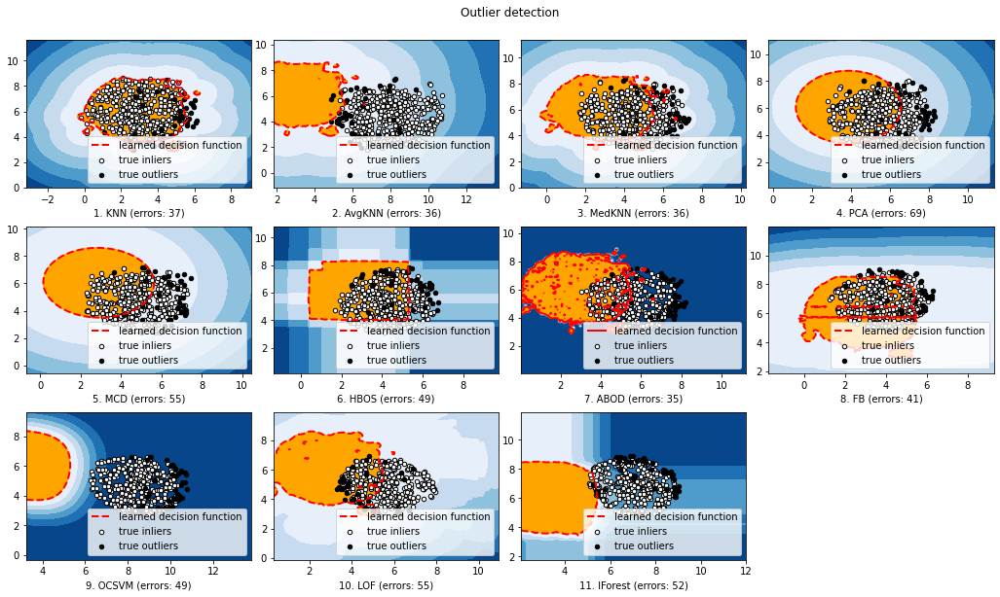

1 loading KNN
2 loading AvgKNN
3 loading MedKNN
4 loading PCA
5 loading MCD
6 loading HBOS
7 loading ABOD
8 loading FB
9 loading OCSVM
10 loading LOF
11 loading IForest


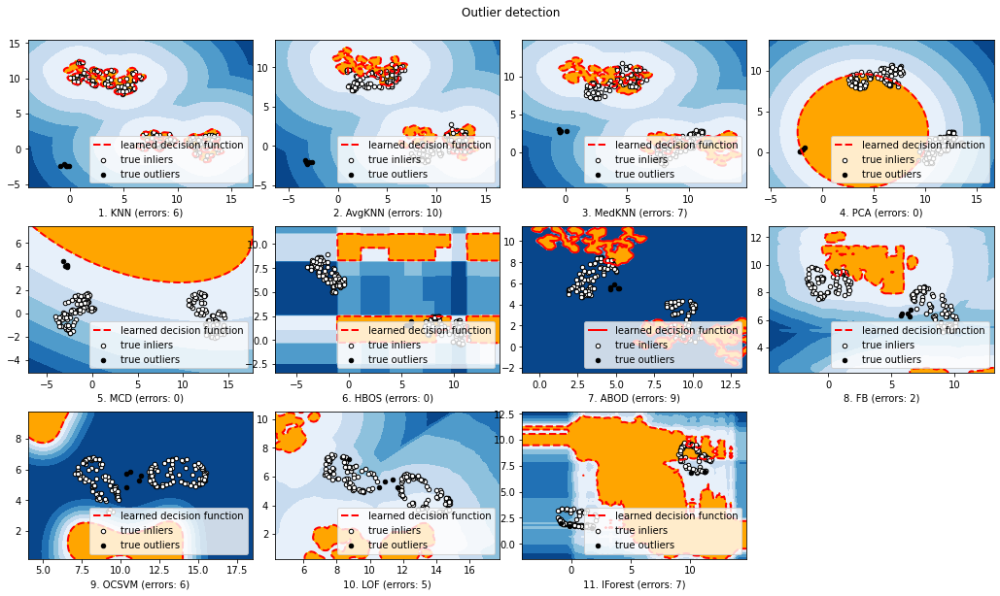

1 loading KNN
2 loading AvgKNN
3 loading MedKNN
4 loading PCA
5 loading MCD
6 loading HBOS
7 loading ABOD
8 loading FB
9 loading OCSVM
10 loading LOF
11 loading IForest


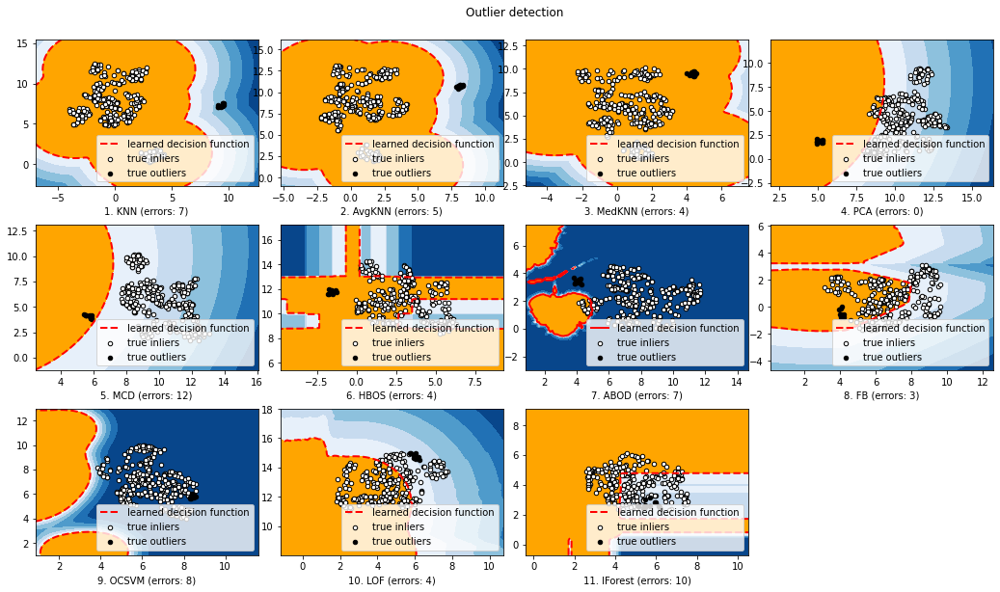

1 loading KNN
2 loading AvgKNN
3 loading MedKNN
4 loading PCA
5 loading MCD
6 loading HBOS
7 loading ABOD
8 loading FB
9 loading OCSVM
10 loading LOF
11 loading IForest


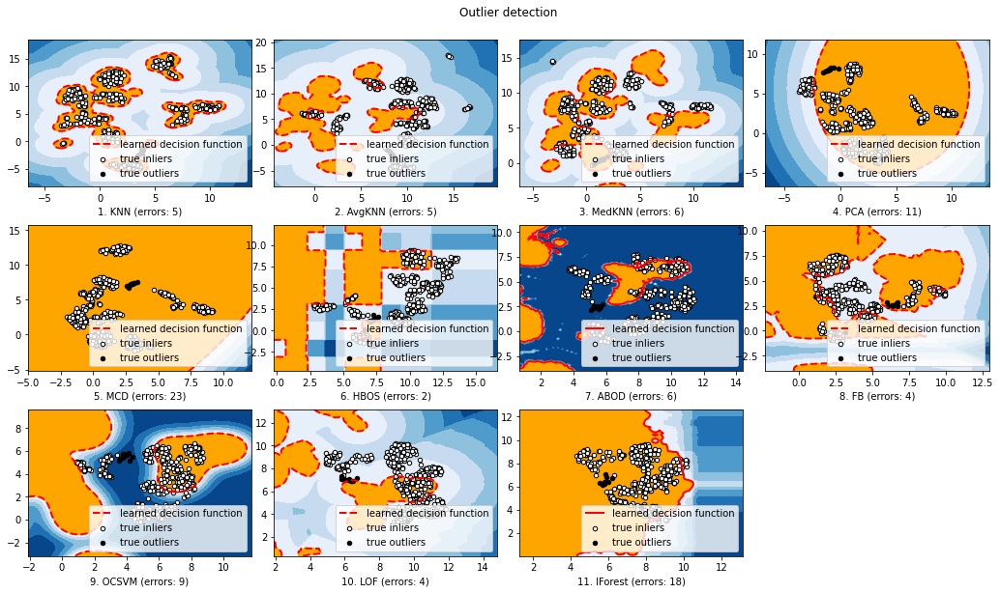

1 loading KNN
2 loading AvgKNN
3 loading MedKNN
4 loading PCA
5 loading MCD
6 loading HBOS
7 loading ABOD
8 loading FB
9 loading OCSVM
10 loading LOF
11 loading IForest


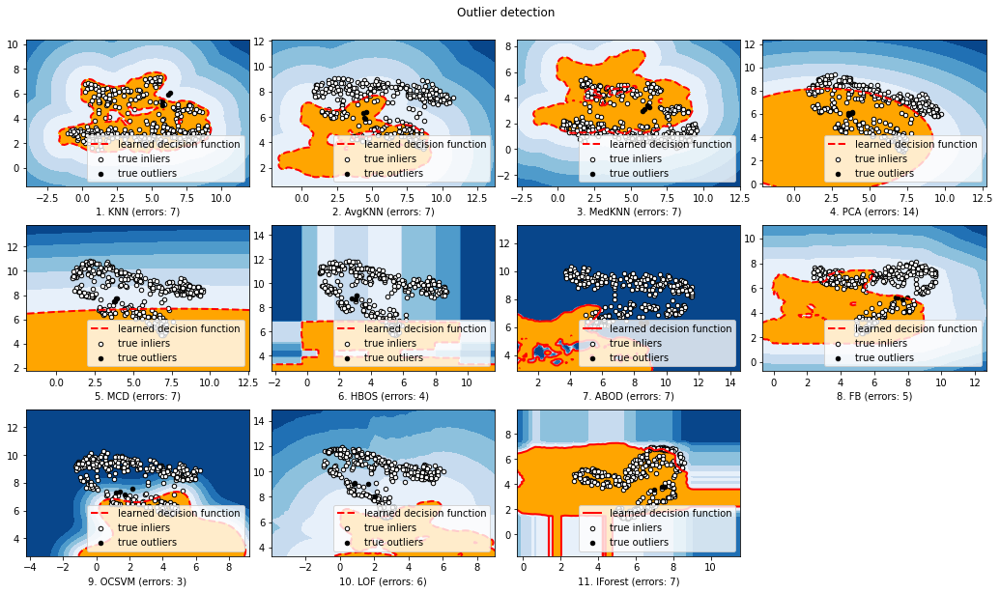

In [ ]:
compare_models_visualization()

## Visualization

### mnist

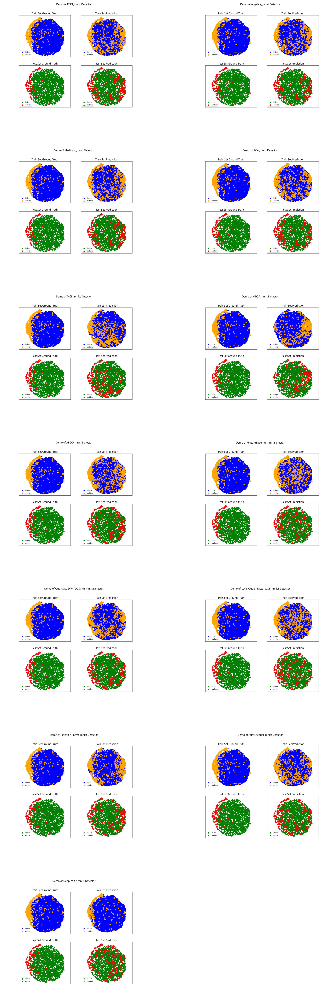

In [23]:
name="mnist"
data=pd.read_csv("mnist.csv")

#降維
import umap
reducer = umap.UMAP(random_state=69,n_neighbors=20, min_dist=0.3, n_components=2, metric='manhattan')
data_umap = reducer.fit_transform(data.iloc[:,0:-1])

#split train/test
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,0:-1],data["outlier"], test_size=0.06, random_state=69)
X_train_umap, X_test_umap, y_train, y_test = train_test_split(data_umap,data["outlier"], test_size=0.06, random_state=69)

#split train/valid
X, X_valid_norm, y, y_valid = train_test_split(X_train,y_train, test_size=0.25, random_state=5)
X_umap, X_valid_norm_umap, y, y_valid = train_test_split(X_train_umap,y_train, test_size=0.25, random_state=5)

#標準化
X, X_valid_norm = standardizer(X, X_valid_norm)
X_umap, X_valid_norm_umap = standardizer(X_umap, X_valid_norm_umap)

# count outliers_ratio
unique, counts = np.unique(y, return_counts=True)
outliers_fraction=counts[1]/counts[0]

#roc_list,recall_list
roc_list=[]
recall_list=[]

classifiers = {'KNN':KNN(n_neighbors=50,method='largest'),
            'AvgKNN':KNN(n_neighbors=50,method='mean'),
            'MedKNN':KNN(n_neighbors=50,method='median'),
            'PCA':PCA(random_state=69),
            'MCD':MCD(random_state=69),
            'HBOS':HBOS(n_bins=15),
            'ABOD':ABOD(n_neighbors=50,method='fast'),
            'FeatureBagging':FeatureBagging(random_state=69),
            'One-class SVM (OCSVM)':OCSVM(contamination=outliers_fraction),
            'Local Outlier Factor (LOF)': LOF(contamination=outliers_fraction,n_neighbors=110),
            'Isolation Forest': IForest(contamination=outliers_fraction,n_estimators=200,random_state=69),
            'AutoEncoder': AutoEncoder(hidden_neurons=[2, 32,64,64, 32, 2],contamination=outliers_fraction,random_state=69,epochs=150),
            'DeepSVDD':DeepSVDD(hidden_neurons=[X.shape[1],X.shape[1]*20], contamination=outliers_fraction,random_state=69,epochs=100,validation_size=0.05) }

for clf_name, clf in classifiers.items():

    # Build the Model
    clf_name = clf_name
    clf = clf

    # Fit detector
    clf.fit(X[y == 0])
    # pred data
    y_train_pred = clf.predict(X)
    y_valid_pred = clf.predict(X_valid_norm)  

    visualize(clf_name+"_"+name, X_umap, y, X_valid_norm_umap, y_valid, y_train_pred,y_valid_pred, show_figure=True, save_figure=True)

### musk

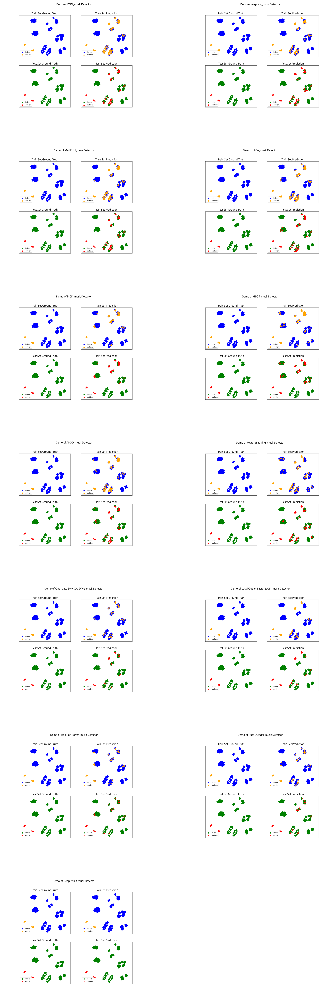

In [24]:
name="musk"
data=pd.read_csv("musk.csv")

#降維
import umap
reducer = umap.UMAP(random_state=69,n_neighbors=20, min_dist=0.3, n_components=2, metric='manhattan')
data_umap = reducer.fit_transform(data.iloc[:,0:-1])

#split train/test
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,0:-1],data["outlier"], test_size=0.06, random_state=69)
X_train_umap, X_test_umap, y_train, y_test = train_test_split(data_umap,data["outlier"], test_size=0.06, random_state=69)

#split train/valid
X, X_valid_norm, y, y_valid = train_test_split(X_train,y_train, test_size=0.25, random_state=5)
X_umap, X_valid_norm_umap, y, y_valid = train_test_split(X_train_umap,y_train, test_size=0.25, random_state=5)

#標準化
X, X_valid_norm = standardizer(X, X_valid_norm)
X_umap, X_valid_norm_umap = standardizer(X_umap, X_valid_norm_umap)

# count outliers_ratio
unique, counts = np.unique(y, return_counts=True)
outliers_fraction=counts[1]/counts[0]

#roc_list,recall_list
roc_list=[]
recall_list=[]

classifiers = {'KNN':KNN(n_neighbors=50,method='largest'),
            'AvgKNN':KNN(n_neighbors=50,method='mean'),
            'MedKNN':KNN(n_neighbors=50,method='median'),
            'PCA':PCA(random_state=69),
            'MCD':MCD(random_state=69),
            'HBOS':HBOS(n_bins=15),
            'ABOD':ABOD(n_neighbors=50,method='fast'),
            'FeatureBagging':FeatureBagging(random_state=69),
            'One-class SVM (OCSVM)':OCSVM(contamination=outliers_fraction),
            'Local Outlier Factor (LOF)': LOF(contamination=outliers_fraction,n_neighbors=110),
            'Isolation Forest': IForest(contamination=outliers_fraction,n_estimators=200,random_state=69),
            'AutoEncoder': AutoEncoder(hidden_neurons=[2, 32,64,64, 32, 2],contamination=outliers_fraction,random_state=69,epochs=150),
            'DeepSVDD':DeepSVDD(hidden_neurons=[X.shape[1],X.shape[1]*20], contamination=outliers_fraction,random_state=69,epochs=100,validation_size=0.05) }



for clf_name, clf in classifiers.items():

    # Build the Model
    clf_name = clf_name
    clf = clf

    # Fit detector
    clf.fit(X[y == 0])
    # pred data
    y_train_pred = clf.predict(X)
    y_valid_pred = clf.predict(X_valid_norm)  

    visualize(clf_name+"_"+name, X_umap, y, X_valid_norm_umap, y_valid, y_train_pred,y_valid_pred, show_figure=True, save_figure=True)

### optdigits

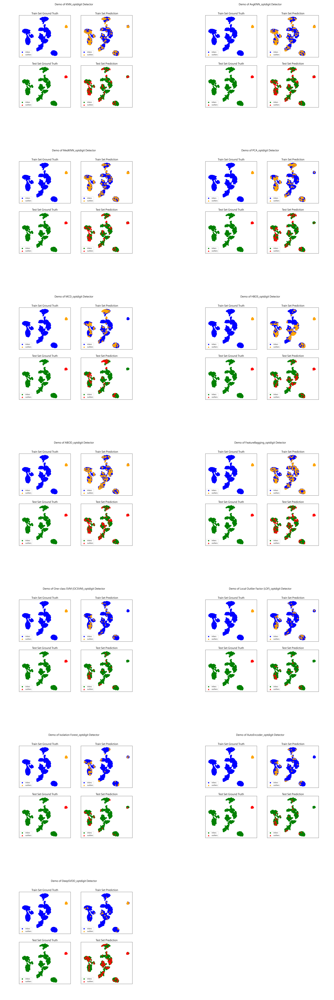

In [25]:
name="optdigits"
data=pd.read_csv("optdigits.csv")

#降維
import umap
reducer = umap.UMAP(random_state=69,n_neighbors=20, min_dist=0.3, n_components=2, metric='manhattan')
data_umap = reducer.fit_transform(data.iloc[:,0:-1])

#split train/test
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,0:-1],data["outlier"], test_size=0.06, random_state=69)
X_train_umap, X_test_umap, y_train, y_test = train_test_split(data_umap,data["outlier"], test_size=0.06, random_state=69)

#split train/valid
X, X_valid_norm, y, y_valid = train_test_split(X_train,y_train, test_size=0.25, random_state=5)
X_umap, X_valid_norm_umap, y, y_valid = train_test_split(X_train_umap,y_train, test_size=0.25, random_state=5)

#標準化
X, X_valid_norm = standardizer(X, X_valid_norm)
X_umap, X_valid_norm_umap = standardizer(X_umap, X_valid_norm_umap)

# count outliers_ratio
unique, counts = np.unique(y, return_counts=True)
outliers_fraction=counts[1]/counts[0]

#roc_list,recall_list
roc_list=[]
recall_list=[]

classifiers = {'KNN':KNN(n_neighbors=50,method='largest'),
            'AvgKNN':KNN(n_neighbors=50,method='mean'),
            'MedKNN':KNN(n_neighbors=50,method='median'),
            'PCA':PCA(random_state=69),
            'MCD':MCD(random_state=69),
            'HBOS':HBOS(n_bins=15),
            'ABOD':ABOD(n_neighbors=50,method='fast'),
            'FeatureBagging':FeatureBagging(random_state=69),
            'One-class SVM (OCSVM)':OCSVM(contamination=outliers_fraction),
            'Local Outlier Factor (LOF)': LOF(contamination=outliers_fraction,n_neighbors=110),
            'Isolation Forest': IForest(contamination=outliers_fraction,n_estimators=200,random_state=69),
            'AutoEncoder': AutoEncoder(hidden_neurons=[2, 32,64,64, 32, 2],contamination=outliers_fraction,random_state=69,epochs=150),
            'DeepSVDD':DeepSVDD(hidden_neurons=[X.shape[1],X.shape[1]*20], contamination=outliers_fraction,random_state=69,epochs=100,validation_size=0.05) }

for clf_name, clf in classifiers.items():

    # Build the Model
    clf_name = clf_name
    clf = clf

    # Fit detector
    clf.fit(X[y == 0])
    # pred data
    y_train_pred = clf.predict(X)
    y_valid_pred = clf.predict(X_valid_norm)  

    visualize(clf_name+"_"+name, X_umap, y, X_valid_norm_umap, y_valid, y_train_pred,y_valid_pred, show_figure=True, save_figure=True)

### pendigits

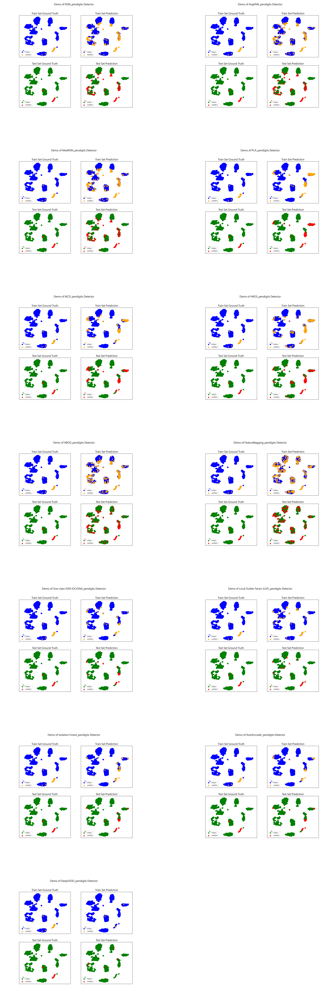

In [26]:
name="pendigits"
data=pd.read_csv("pendigits.csv")

#降維
import umap
reducer = umap.UMAP(random_state=69,n_neighbors=20, min_dist=0.3, n_components=2, metric='manhattan')
data_umap = reducer.fit_transform(data.iloc[:,0:-1])

#split train/test
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,0:-1],data["outlier"], test_size=0.06, random_state=69)
X_train_umap, X_test_umap, y_train, y_test = train_test_split(data_umap,data["outlier"], test_size=0.06, random_state=69)

#split train/valid
X, X_valid_norm, y, y_valid = train_test_split(X_train,y_train, test_size=0.25, random_state=5)
X_umap, X_valid_norm_umap, y, y_valid = train_test_split(X_train_umap,y_train, test_size=0.25, random_state=5)

#標準化
X, X_valid_norm = standardizer(X, X_valid_norm)
X_umap, X_valid_norm_umap = standardizer(X_umap, X_valid_norm_umap)

# count outliers_ratio
unique, counts = np.unique(y, return_counts=True)
outliers_fraction=counts[1]/counts[0]

#roc_list,recall_list
roc_list=[]
recall_list=[]

classifiers = {'KNN':KNN(n_neighbors=50,method='largest'),
            'AvgKNN':KNN(n_neighbors=50,method='mean'),
            'MedKNN':KNN(n_neighbors=50,method='median'),
            'PCA':PCA(random_state=69),
            'MCD':MCD(random_state=69),
            'HBOS':HBOS(n_bins=15),
            'ABOD':ABOD(n_neighbors=50,method='fast'),
            'FeatureBagging':FeatureBagging(random_state=69),
            'One-class SVM (OCSVM)':OCSVM(contamination=outliers_fraction),
            'Local Outlier Factor (LOF)': LOF(contamination=outliers_fraction,n_neighbors=110),
            'Isolation Forest': IForest(contamination=outliers_fraction,n_estimators=200,random_state=69),
            'AutoEncoder': AutoEncoder(hidden_neurons=[2, 32,64,64, 32, 2],contamination=outliers_fraction,random_state=69,epochs=150),
            'DeepSVDD':DeepSVDD(hidden_neurons=[X.shape[1],X.shape[1]*20], contamination=outliers_fraction,random_state=69,epochs=100,validation_size=0.05) }

for clf_name, clf in classifiers.items():

    # Build the Model
    clf_name = clf_name
    clf = clf

    # Fit detector
    clf.fit(X[y == 0])
    # pred data
    y_train_pred = clf.predict(X)
    y_valid_pred = clf.predict(X_valid_norm)  

    visualize(clf_name+"_"+name, X_umap, y, X_valid_norm_umap, y_valid, y_train_pred,y_valid_pred, show_figure=True, save_figure=True)

### satimage-2

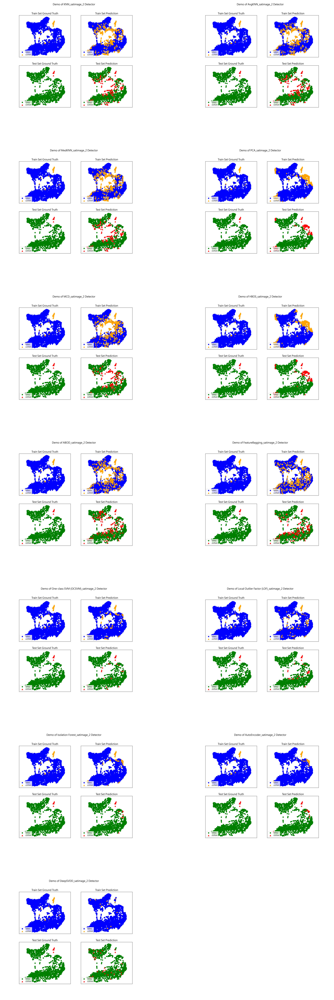

In [29]:
name="satimage-2"
data=pd.read_csv("satimage-2.csv")

#降維
import umap
reducer = umap.UMAP(random_state=69,n_neighbors=20, min_dist=0.3, n_components=2, metric='manhattan')
data_umap = reducer.fit_transform(data.iloc[:,0:-1])

#split train/test
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,0:-1],data["outlier"], test_size=0.06, random_state=69)
X_train_umap, X_test_umap, y_train, y_test = train_test_split(data_umap,data["outlier"], test_size=0.06, random_state=69)

#split train/valid
X, X_valid_norm, y, y_valid = train_test_split(X_train,y_train, test_size=0.25, random_state=5)
X_umap, X_valid_norm_umap, y, y_valid = train_test_split(X_train_umap,y_train, test_size=0.25, random_state=5)

#標準化
X, X_valid_norm = standardizer(X, X_valid_norm)
X_umap, X_valid_norm_umap = standardizer(X_umap, X_valid_norm_umap)

# count outliers_ratio
unique, counts = np.unique(y, return_counts=True)
outliers_fraction=counts[1]/counts[0]

#roc_list,recall_list
roc_list=[]
recall_list=[]

classifiers = {'KNN':KNN(n_neighbors=50,method='largest'),
            'AvgKNN':KNN(n_neighbors=50,method='mean'),
            'MedKNN':KNN(n_neighbors=50,method='median'),
            'PCA':PCA(random_state=69),
            'MCD':MCD(random_state=69),
            'HBOS':HBOS(n_bins=15),
            'ABOD':ABOD(n_neighbors=50,method='fast'),
            'FeatureBagging':FeatureBagging(random_state=69),
            'One-class SVM (OCSVM)':OCSVM(contamination=outliers_fraction),
            'Local Outlier Factor (LOF)': LOF(contamination=outliers_fraction,n_neighbors=110),
            'Isolation Forest': IForest(contamination=outliers_fraction,n_estimators=200,random_state=69),
            'AutoEncoder': AutoEncoder(hidden_neurons=[2, 32,64,64, 32, 2],contamination=outliers_fraction,random_state=69,epochs=150),
            'DeepSVDD':DeepSVDD(hidden_neurons=[X.shape[1],X.shape[1]*20], contamination=outliers_fraction,random_state=69,epochs=100,validation_size=0.05) }

for clf_name, clf in classifiers.items():

    # Build the Model
    clf_name = clf_name
    clf = clf

    # Fit detector
    clf.fit(X[y == 0])
    # pred data
    y_train_pred = clf.predict(X)
    y_valid_pred = clf.predict(X_valid_norm)  

    visualize(clf_name+"_"+name, X_umap, y, X_valid_norm_umap, y_valid, y_train_pred,y_valid_pred, show_figure=True, save_figure=True)

# Task 4 結論

1. 在不同的資料集中，使用不同方法會存在相當大的差異  

- **以AUC的角度來看，我們將不同方法偵測異常值的能力，大致分為四個等級**  
  1. LOF、Isolation Forest能在這五筆資料的偵測中有比較一致的結果，這兩個方法在偵測五筆資料的分數至少都在0.85以上，最差的分數也接近0.85。  
  2. KNN、AvgKNN、MedKNN、PCA、MCD、OCSVM、AutoEncoder在第三筆資料的偵測能力較差，只有約0.4的比例能成功預測，OCSVM會提升到0.6，AutoEncoder則有0.56的比例會預測正確；HBOS則是在第一筆資料的偵測能力較差，在所有方法中是最後一名。   
  3. ABOD、DeepSVDD比起前面的方法再稍微差一點，大概有二到三筆資料的分數只有0.4到0.5左右。    
  4. 最後的FeatureBagging相對於其他方法，在這五筆資料上看起來或許是有比較一致的結果，但分數僅落在0.45~0.7之間，整體而言較低。    
      


- **以Recall@n的角度來看，相同方法在不同資料上的分數落差很大。我們將不同方法，大致上分為四個等級**  

  1. LOF有三筆資料的分數可以到0.8以上，最差的分數也有接近0.4，算是在高分數的方法中相對落差較小的方法
  2. KNN、AvgKNN、MedKNN、PCA、MCD、HBOS、OCSVM、AutoEncoder則在第二筆與第五筆資料中有非常好的預測效果，其中幾個方法的分數甚至可以比LOF在高，但除了HBOS，其他方法在地三筆資料的分數慘不忍睹，都不到0.1  
  3. ABOD、Isolation Forest在五個資料中，僅有第五筆資料的預測結果較好，而DeepSVDD只有在第二筆資料的預測效果較好
  4. FeatureBagging在這項分數評比中，仍然是所有方法裡面最差的，最高分只有第二筆資料的0.46，整體而言算是相當一致的低，但在第三筆資料的預測反而比一半的方法還要好一點  
  
2. 就分析的結果而言，我們認為LOF滿適合上面的五筆資料，而FeatureBagging最不太適合上面的五筆資料。

- 在程式執行速度

  - 我們注意到有其中幾種模型的運算時間非常久，像是深度學習的AutoEncoder、DeepSVDD，還有ABOD。以課堂上沒有介紹過的方法而言，ABOD這個方法在每一次執行時都需要花費約十分鐘才能完成，雖然模型內有提供一個參數可以加速運算時間，節省的時間依舊很有限。  
  
- 模型參數設定

  - 我們發現模型是否有調整參數會對最後的結果造成很大的影響，而深度學習的DeepSVDD，不管如何調整參數，結果都不盡理想，不確定是否因為我們對於模型不夠理解，才會造成預測不佳。另外有些模型在每次run都會有不一樣的結果，因此我們有設seed=69，以確保模型之間可以互相比較。    

3. 若是從以Umap降維的2D圖片來觀察，mnist的outlier較為分散，不像其他資料集一樣集中某個特定區域，而outlier越集中可能代表彼此相似度較高，而從我們13個模型中，可以發現似乎越集中的資料反而較容易出現極端的預測，要不是特別好，就是特別差，反而資料有一些誤差（不集中）的預測，普遍來說較為穩定。


4. 以整體預測異常值最差的optdigits為目標，HBOS方法的異常值偵測在optdigits都異常的表現良好，不管是AUC或是Recall@N，都表現非凡，AUC有0.878、Recall@N有0.532。而若是以AUC為基準，LOF、Isolation Forest都表現也不錯。


5. 從AUC表格、Recall@N表格而言，我們可以看到musk、satimage-2這兩個資料集，多數模型的預測分數都很高，於是我們查看原始資料，發現這兩筆資料的所有數值都是整數型別，我們會認為整數在計算上會比較容易偵測到異常值的出現。而在mnist、optdigits這兩筆資料，有一些特徵的值幾乎為0，我們認為這可能會影響到異常值偵測，模型可能會認為在很多個0之中出現異於0的值，就將那個觀察值判定為異常值。
   
6. 我們考慮到有一些資料的欄位數量過多，造成我們在前面的執行效率不太好，因此我們使用umap降維，將欄位降到二維後，我們再將二維的資料作標準化，讓兩個欄位的尺度統一。接著，我們選擇前面的表格中，分數較高的前五個模型組合，分別是KNN, ABOD, FB, OCSVM以及LOF，成為我們的新模型。我們的方法在多數情況下可以超越其他模型，因為My Model包含了多個單一模型的預測能力，可以同時具有線性或非線性的決策邊界，還有整合proximiy跟density的不同概念，這種ensemble的方式通常能夠擊敗單一模型，也因此更容易掌握outlier潛在的特徵。

7. 除了satimage-2這個資料集外，My Model在其他四個資料集的表現都非常好，我們認為這是因為此資料集的outlier比率較低，而其他資料的outlier比例較高，而且資料的維度也很大，例如mnist這個資料集就很符合這個特性，因此My Model可以有效率的掌握原始資料的分布狀況。

## Citations

[PyOD內部其他程式碼](https://github.com/yzhao062/pyod)